# Post-TARE Adoption KPIs: Bill Savings & Demand Change
**Author:** Jordan M. Joseph, PhD â€” Carnegie Mellon University

Computes bill savings ratio and electricity demand change metrics from TARE model outputs and EUSS data.

In [24]:
import os
import importlib
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

from config import PROJECT_ROOT
from cmu_tare_model.constants import VALID_MENU_MPS
from cmu_tare_model.utils.load_exported_results_to_df import load_measure_package_data

from cmu_tare_model.adoption_kpis import (
    load_euss_baseline, load_euss_upgrade, mp_to_upgrade,
    compute_scenario_demand, aggregate_demand,
    compute_bill_savings_ratio, aggregate_bill_savings,
    compute_adoption_rate,
)
from cmu_tare_model.grid_impact.peak_load_functions import find_adoption_column

from cmu_tare_model.adoption_kpis.visualize_geospatial_data import (
    prepare_state_geodataframe, plot_combined_choropleth,
)
from cmu_tare_model.adoption_kpis.data_loading import (
    SHAPEFILE_PATH, COUNTY_SHAPEFILE_PATH,
)

# Adoption potential: multi-index DataFrame and dotplot
from cmu_tare_model.adoption_potential.data_processing.visuals_adoption_potential import (
    build_adoption_scenario_names,
    create_multiIndex_adoption_df,
    print_adoption_decision_percentages,
    subplot_grid_adoption_vBar
)

from cmu_tare_model.adoption_potential.data_processing.visuals_adoption_dotplot import (
    prepare_plot_data,
    plot_adoption_panel,
    _build_legend_handles,
    GROUPING_ORDER,
)

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 60)
SAVE_FIGURES = False  # Set to True to save figure files to disk

print("[OK] Imports loaded")


[OK] Imports loaded


In [25]:
SELECTABLE_MPS = [mp for mp in VALID_MENU_MPS if mp != 0]

try:
    _ = input_measure_package
    batch_mode = True
    selected_mps = [int(input_measure_package)]
    print(f"BATCH MODE: Running for MP{selected_mps[0]}")
except NameError:
    batch_mode = False
    print(f"Available measure packages: {SELECTABLE_MPS}")
    mp_input = input("Enter MP numbers (comma-separated, or 'all'): ").strip()
    if mp_input.lower() == 'all':
        selected_mps = SELECTABLE_MPS
    else:
        selected_mps = [int(x.strip()) for x in mp_input.split(',') if x.strip().isdigit()]
        selected_mps = [mp for mp in selected_mps if mp in SELECTABLE_MPS]
    if not selected_mps:
        selected_mps = [4]
        print("No valid MPs selected. Defaulting to MP4.")

print(f"Selected measure packages: {selected_mps}")

Available measure packages: [3, 4]
Selected measure packages: [3, 4]


In [26]:
# Hardcoded for reproducibility — non-interactive session (no stdin).
# LOCATION_ID: str = "National"
# MODEL_RUN_DATE_TIME: str = "2026-04-10_00-05"

# Load TARE model outputs for selected measure packages.
# These contain per-building lifetime fuel costs used for bill savings ratio.

try:
    _ = DATAFRAMES_BY_MP
    print(f"DATAFRAMES_BY_MP already loaded: {list(DATAFRAMES_BY_MP.keys())}")
except NameError:
    try:
        _ = output_folder_path
        print(f"Using existing output_folder_path: {output_folder_path}")
    except NameError:
        output_folder_path = os.path.join(PROJECT_ROOT, "cmu_tare_model", "output_results")
        location_id = input("Enter location ID (e.g., 'National' or 'PA'): ").strip()
        model_run_date_time = input("Enter model run timestamp (YYYY-MM-DD_HH-MM): ").strip()

    DATAFRAMES_BY_MP = {}
    for mp in selected_mps:
        DATAFRAMES_BY_MP[mp] = load_measure_package_data(
            mp, output_folder_path, location_id, model_run_date_time
        )
    print(f"[OK] Loaded TARE data for MPs: {list(DATAFRAMES_BY_MP.keys())}")


DATAFRAMES_BY_MP already loaded: [3, 4]


In [27]:
df_baseline = load_euss_baseline()
print(f"Baseline: {len(df_baseline):,} occupied SF homes")

upgrade_data = {}
for mp in selected_mps:
    upgrade_name = mp_to_upgrade(mp)
    print(f"\nLoading MP{mp} ({upgrade_name})...")
    upgrade_data[mp] = load_euss_upgrade(upgrade_name)
    print(f"  MP{mp}: {len(upgrade_data[mp]):,} applicable homes")

print(f"\n[OK] EUSS data loaded")

Loading baseline from: c:\users\jorda\desktop\projects\cmu-tare-model\cmu_tare_model\data\euss_data\resstock_amy2018_release_1.1\national\csv\baseline_metadata_and_annual_results.csv


c:\users\jorda\desktop\projects\cmu-tare-model\cmu_tare_model\adoption_kpis\data_loading.py:188: DtypeWarning: Columns (61,113,121) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(filepath, index_col="bldg_id")


  After occupancy filter: 482,597 / 548,916
  After housing type filter (['Single-Family Attached', 'Single-Family Detached']): 331,531
Baseline: 331,531 occupied SF homes

Loading MP3 (upgrade03)...
Loading upgrade03 from: c:\users\jorda\desktop\projects\cmu-tare-model\cmu_tare_model\data\euss_data\resstock_amy2018_release_1.1\national\csv\upgrade03_metadata_and_annual_results.csv


c:\users\jorda\desktop\projects\cmu-tare-model\cmu_tare_model\adoption_kpis\data_loading.py:222: DtypeWarning: Columns (61,113,121) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(filepath, index_col="bldg_id")


  After occupancy filter: 482,597 / 548,916
  After housing type filter: 331,531
  After applicability filter: 331,526
  MP3: 331,526 applicable homes

Loading MP4 (upgrade04)...
Loading upgrade04 from: c:\users\jorda\desktop\projects\cmu-tare-model\cmu_tare_model\data\euss_data\resstock_amy2018_release_1.1\national\csv\upgrade04_metadata_and_annual_results.csv


c:\users\jorda\desktop\projects\cmu-tare-model\cmu_tare_model\adoption_kpis\data_loading.py:222: DtypeWarning: Columns (61,113,121) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(filepath, index_col="bldg_id")


  After occupancy filter: 482,597 / 548,916
  After housing type filter: 331,531
  After applicability filter: 331,526
  MP4: 331,526 applicable homes

[OK] EUSS data loaded


In [28]:
DATAFRAMES_BY_MP[mp]['fixed_base']['inmap'].columns.tolist()

['square_footage',
 'census_region',
 'census_division',
 'census_division_recs',
 'building_america_climate_zone',
 'reeds_balancing_area',
 'gea_region',
 'state',
 'city',
 'urbanicity',
 'county',
 'county_fips',
 'puma',
 'county_and_puma',
 'weather_file_city',
 'Longitude',
 'Latitude',
 'building_type',
 'income',
 'federal_poverty_level',
 'occupancy',
 'tenure',
 'vacancy_status',
 'vintage',
 'base_heating_fuel',
 'heating_type',
 'base_heating_efficiency',
 'base_electricity_heating_consumption',
 'base_fuelOil_heating_consumption',
 'base_naturalGas_heating_consumption',
 'base_propane_heating_consumption',
 'base_cooling_fuel',
 'cooling_type',
 'base_cooling_efficiency',
 'base_electricity_cooling_consumption',
 'baseline_heating_consumption',
 'include_all',
 'valid_fuel_heating',
 'valid_tech_heating',
 'include_heating',
 'baseline_heating_lifetime_mt_co2e_lrmer',
 'baseline_heating_lifetime_damages_climate_lrmer_lower',
 'baseline_heating_lifetime_damages_climate_lrm

In [29]:
bill_savings_geo_level = 'county'

bill_savings_results = {}
for mp in selected_mps:
    print(f"\n{'='*60}")
    print(f"BILL SAVINGS RATIO — MP{mp}, all fuels")
    print(f"{'='*60}")
    df_tare = DATAFRAMES_BY_MP[mp]['fixed_base']['inmap']
    df_ratio = compute_bill_savings_ratio(
        df_tare, mp=mp, policy_scenario='iraRef',
        fuel_filter=None, verbose=True,
        df_euss=df_baseline,
    )
    df_bill_savings_county = aggregate_bill_savings(
        df_ratio, geo_level=bill_savings_geo_level, verbose=True
    )
    bill_savings_results[mp] = df_bill_savings_county

print(f"\n[OK] Bill savings ratio complete ({bill_savings_geo_level}-level)")



BILL SAVINGS RATIO — MP3, all fuels
Per-building records (non-null ratio): 280,250
Median bill savings ratio: 0.725
Mean bill savings ratio:   0.919
Counties where median home saves money (ratio < 1): 2934 / 3098
National median of counties medians: 0.615

BILL SAVINGS RATIO — MP4, all fuels
Per-building records (non-null ratio): 280,250
Median bill savings ratio: 0.449
Mean bill savings ratio:   0.470
Counties where median home saves money (ratio < 1): 3082 / 3098
National median of counties medians: 0.394

[OK] Bill savings ratio complete (county-level)


In [30]:
if bill_savings_geo_level == 'state':
    for mp, df_state in bill_savings_results.items():
        print(f"\n===== BILL SAVINGS RATIO (MP{mp}, NG homes) =====")
        n_savings = (df_state['median_bill_savings_ratio'] < 1.0).sum()
        print(f"States where median home saves money: {n_savings} / {len(df_state)}")
        print(f"National median: {df_state['median_bill_savings_ratio'].median():.3f}")
        print(f"\nTop 5 (best for electrification):")
        print(df_state.nsmallest(5, 'median_bill_savings_ratio')[
            ['state', 'median_bill_savings_ratio', 'pct_bill_change', 'home_count']
        ].to_string(index=False))
        print(f"\nBottom 5 (worst for electrification):")
        print(df_state.nlargest(5, 'median_bill_savings_ratio')[
            ['state', 'median_bill_savings_ratio', 'pct_bill_change', 'home_count']
        ].to_string(index=False))


In [31]:
demand_geo_level = 'county'

demand_results = {}
for mp in selected_mps:
    print(f"\n{'='*60}")
    print(f"DEMAND CHANGE — MP{mp}, all fuels, 100% adoption")
    print(f"{'='*60}")
    df_demand = compute_scenario_demand(
        df_baseline, upgrade_data[mp], fuel_filter=None, verbose=True,
    )
    df_demand_county = aggregate_demand(
        df_demand, geo_level=demand_geo_level, verbose=True
    )
    demand_results[mp] = df_demand_county

print(f"\n[OK] Demand change complete ({demand_geo_level}-level)")



DEMAND CHANGE — MP3, all fuels, 100% adoption

--- Demand Scenario Summary (100% adoption, all fuels) ---
Total homes: 331,526
Weighted electricity demand change:  +427,043.7 GWh (grid impact)
Weighted total site energy change:   +427,043.7 GWh (efficiency)
✓ Demand accounting check passed

--- County-Level Demand Summary ---
Counties: 3098
Total elec demand change:    +427043.7 GWh (grid impact)

DEMAND CHANGE — MP4, all fuels, 100% adoption

--- Demand Scenario Summary (100% adoption, all fuels) ---
Total homes: 331,526
Weighted electricity demand change:  +30,618.3 GWh (grid impact)
Weighted total site energy change:   +30,618.3 GWh (efficiency)
✓ Demand accounting check passed

--- County-Level Demand Summary ---
Counties: 3098
Total elec demand change:    +30618.4 GWh (grid impact)

[OK] Demand change complete (county-level)


In [32]:
# ============================================================
# TASK 1 DIAGNOSTICS — County sample size & coverage
# ============================================================

print("=" * 65)
print("DIAGNOSTIC: Homes entering aggregation")
print("=" * 65)
print(f"fuel_filter=None confirmed: {len(df_ratio):,} homes "
      f"(expected ~331K, NOT ~181K)")
print(f"Unique counties (bill savings): {df_ratio['in.county'].nunique():,}")
print(f"Homes entering demand:          {len(df_demand):,}")
print(f"Unique counties (demand):       {df_demand['in.county'].nunique():,}")

print("\n--- County sample size distribution (demand, last MP) ---")
county_counts = df_demand.groupby('in.county').size()
print(f"Counties total:             {len(county_counts):,}")
print(f"Min / Median / Mean / Max:  "
      f"{county_counts.min()} / {county_counts.median():.0f} / "
      f"{county_counts.mean():.1f} / {county_counts.max()}")
for thresh in [5, 10, 15, 20, 30]:
    below = (county_counts < thresh).sum()
    above = (county_counts >= thresh).sum()
    print(f"  below {thresh:2d}: {below:4d}   |   at or above {thresh:2d}: {above:4d}")

print("\n--- Aggregated output coverage ---")
from cmu_tare_model.adoption_kpis import aggregate_bill_savings, aggregate_demand
for t in [5, 10, 15, 20, 30]:
    d = aggregate_demand(df_demand, geo_level='county', min_home_count=t)
    n_data = d['pct_elec_demand_change'].notna().sum()
    print(f"  min_home_count={t:2d}: {n_data:4d} counties with data")


DIAGNOSTIC: Homes entering aggregation
fuel_filter=None confirmed: 331,531 homes (expected ~331K, NOT ~181K)
Unique counties (bill savings): 3,098
Homes entering demand:          331,526
Unique counties (demand):       3,098

--- County sample size distribution (demand, last MP) ---
Counties total:             3,098
Min / Median / Mean / Max:  1 / 31 / 107.0 / 7508
  below  5:  188   |   at or above  5: 2910
  below 10:  497   |   at or above 10: 2601
  below 15:  805   |   at or above 15: 2293
  below 20: 1070   |   at or above 20: 2028
  below 30: 1486   |   at or above 30: 1612

--- Aggregated output coverage ---
  min_home_count= 5: 2910 counties with data
  min_home_count=10: 2601 counties with data
  min_home_count=15: 2293 counties with data
  min_home_count=20: 2028 counties with data
  min_home_count=30: 1612 counties with data


In [33]:
if demand_geo_level == 'state':
    for mp, df_state in demand_results.items():
        print(f"\n===== DEMAND CHANGE (MP{mp}, GWh, all fuels, 100% adoption) =====")
        print(f"Total elec demand change: {df_state['elec_change_gwh'].sum():+.1f} GWh")
        print(f"Total site energy change: {df_state['site_energy_change_gwh'].sum():+.1f} GWh")
        print(f"\nTop 5 (largest elec demand increase):")
        print(df_state[['state', 'elec_change_gwh', 'pct_elec_demand_change',
                        'site_energy_change_gwh', 'pct_site_energy_change']].head(5).to_string(index=False))
        print(f"\nBottom 5:")
        print(df_state[['state', 'elec_change_gwh', 'pct_elec_demand_change',
                        'site_energy_change_gwh', 'pct_site_energy_change']].tail(5).to_string(index=False))

[OK] State shapefile loaded: 52 features
[OK] County shapefile loaded: 3235 features
Bill savings ratio norm: [0.186, 1.0 (center), 1.814]
Bill savings % norm: [-81.4, 0 (center), 81.4]%
Demand GWh norm: [-1038.3, 0 (center), 1038.3] GWh
Demand % norm: [-217.5, 0 (center), 217.5]%

--- Summary: pct_bill_change ---
  MP3: n=3,083 counties | min=-90.4% | med=-38.5% | mean=-38.6% | max=30.5% | 95.2% of counties HP saves money (< 0%)
  MP4: n=3,083 counties | min=-91.1% | med=-60.6% | mean=-58.4% | max=1.9% | 100.0% of counties HP saves money (< 0%)


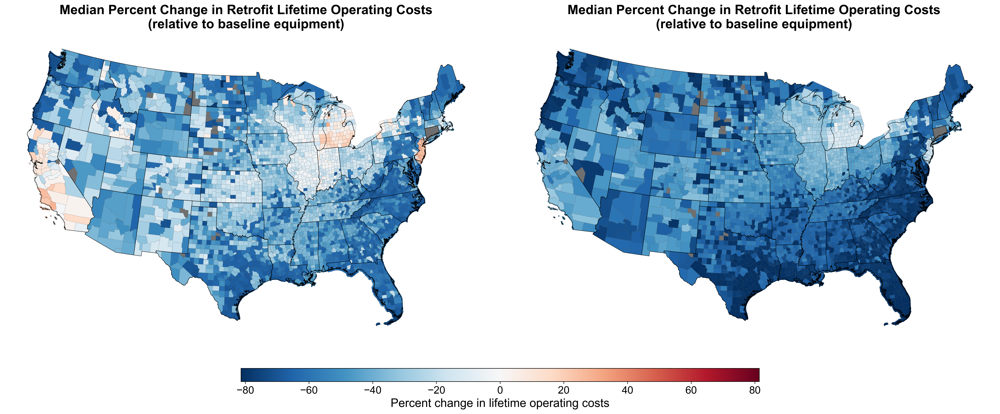


--- Summary: elec_change_gwh ---
  MP3: n=3,098 counties | min=-969.6 | med=16.3 | mean=137.8 | max=12421.2 GWh | total=+427043.7 GWh | 69.5% of counties increase
  MP4: n=3,098 counties | min=-5921.2 | med=-4.6 | mean=9.9 | max=5733.8 GWh | total=+30618.4 GWh | 44.0% of counties increase


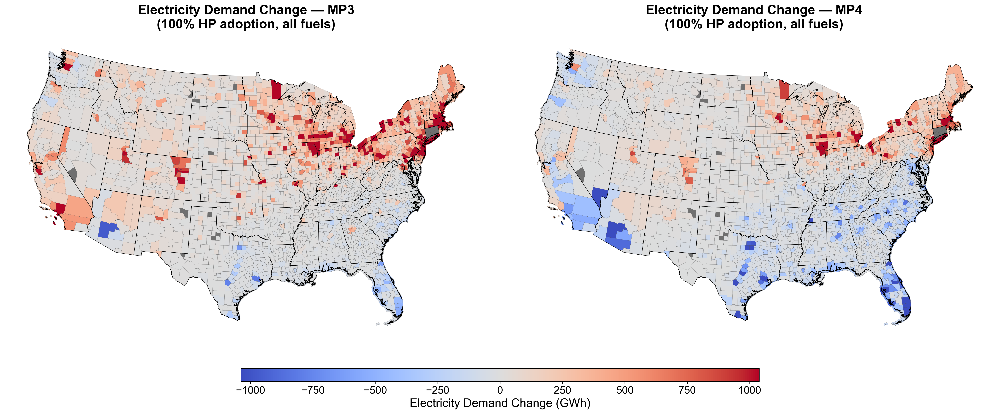


--- Summary: pct_elec_demand_change ---
  MP3: n=3,098 counties | min=-41.6% | med=22.5% | mean=50.6% | max=622.3% | 69.5% of counties increase demand
  MP4: n=3,098 counties | min=-56.9% | med=-8.1% | mean=12.3% | max=475.0% | 44.0% of counties increase demand


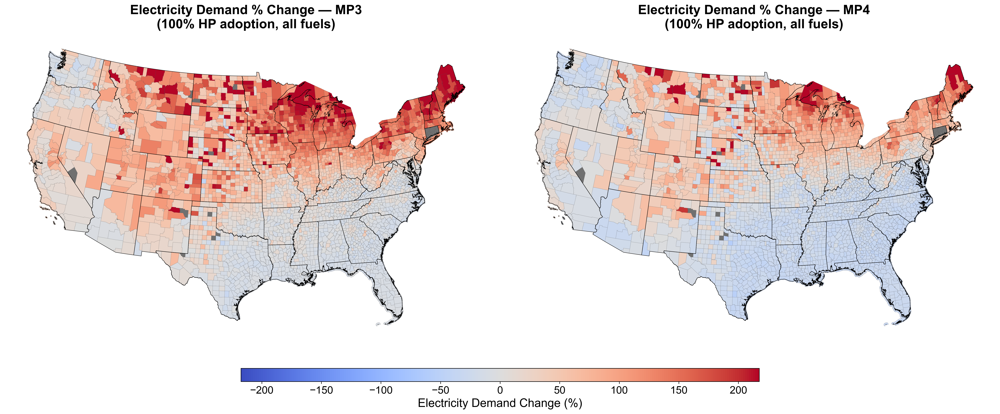

[OK] All county-level maps generated


In [34]:
from matplotlib.colors import Normalize

gdf_states_raw = None
gdf_counties_raw = None

try:
    gdf_states_raw = gpd.read_file(SHAPEFILE_PATH)
    print(f"[OK] State shapefile loaded: {len(gdf_states_raw)} features")
except Exception as e:
    print(f"[WARN] State shapefile not loaded: {e}")

try:
    gdf_counties_raw = gpd.read_file(COUNTY_SHAPEFILE_PATH)
    print(f"[OK] County shapefile loaded: {len(gdf_counties_raw)} features")
except Exception as e:
    print(f"[WARN] County shapefile not loaded: {e} — skipping county maps")

if gdf_counties_raw is not None:
    # pct_bill_change is now computed in aggregate_bill_savings() as:
    #   (median_bill_savings_ratio - 1) × 100
    # No post-hoc derivation needed here.

    # ---- Compute shared norms BEFORE any per-MP map calls ----
    # Symmetric Normalize: keeps white at the meaningful center (0 or 1.0)
    # and makes the colorbar evenly spaced on both sides.
    # Clip to 2nd/98th percentile to avoid extreme outliers compressing the scale.

    # 1. Bill savings ratio — center at 1.0
    all_ratio_vals = pd.concat([
        bill_savings_results[mp]['median_bill_savings_ratio']
        for mp in selected_mps
    ]).dropna()
    _q_low = all_ratio_vals.quantile(0.02)
    _q_high = all_ratio_vals.quantile(0.98)
    _dev = max(abs(_q_low - 1.0), abs(_q_high - 1.0))
    shared_ratio_norm = Normalize(vmin=1.0 - _dev, vmax=1.0 + _dev)
    print(f"Bill savings ratio norm: [{1.0 - _dev:.3f}, 1.0 (center), {1.0 + _dev:.3f}]")

    # 2. Bill savings percent change — center at 0
    # Derived from median ratio so spatial pattern is identical to ratio map.
    all_pct_bill_vals = pd.concat([
        bill_savings_results[mp]['pct_bill_change']
        for mp in selected_mps
    ]).dropna()
    _q_low = all_pct_bill_vals.quantile(0.02)
    _q_high = all_pct_bill_vals.quantile(0.98)
    _abs = max(abs(_q_low), abs(_q_high))
    shared_pct_bill_norm = Normalize(vmin=-_abs, vmax=_abs)
    print(f"Bill savings % norm: [{-_abs:.1f}, 0 (center), {_abs:.1f}]%")

    # 3. Electricity demand change GWh — center at 0
    all_demand_vals = pd.concat([
        demand_results[mp]['elec_change_gwh']
        for mp in selected_mps
    ]).dropna()
    _q_low = all_demand_vals.quantile(0.02)
    _q_high = all_demand_vals.quantile(0.98)
    _abs = max(abs(_q_low), abs(_q_high))
    shared_demand_norm = Normalize(vmin=-_abs, vmax=_abs)
    print(f"Demand GWh norm: [{-_abs:.1f}, 0 (center), {_abs:.1f}] GWh")

    # 4. Electricity demand percent change — center at 0
    all_pct_demand_vals = pd.concat([
        demand_results[mp]['pct_elec_demand_change']
        for mp in selected_mps
    ]).dropna()
    _q_low = all_pct_demand_vals.quantile(0.02)
    _q_high = all_pct_demand_vals.quantile(0.98)
    _abs = max(abs(_q_low), abs(_q_high))
    shared_pct_demand_norm = Normalize(vmin=-_abs, vmax=_abs)
    print(f"Demand % norm: [{-_abs:.1f}, 0 (center), {_abs:.1f}]%")

    # Deleted bill savings ratio map
    # ---- Bill savings percent change (county-level) ----
    # pct_bill_change = (median_bill_savings_ratio - 1) × 100
    # Spatial pattern is identical to Map 1; only the scale changes.
    print("\n--- Summary: pct_bill_change ---")
    for mp in selected_mps:
        _v = bill_savings_results[mp]['pct_bill_change'].dropna()
        _pct = (_v < 0).mean() * 100
        print(f"  MP{mp}: n={len(_v):,} counties | "
              f"min={_v.min():.1f}% | med={_v.median():.1f}% | "
              f"mean={_v.mean():.1f}% | max={_v.max():.1f}% | "
              f"{_pct:.1f}% of counties HP saves money (< 0%)")
        

    plot_combined_choropleth(
        gdf_counties_raw, bill_savings_results,
        column='pct_bill_change',
        title_template='Median Percent Change in Retrofit Lifetime Operating Costs\n(relative to baseline equipment)',
        cbar_label='Percent change in lifetime operating costs',
        cmap='RdBu_r', norm=shared_pct_bill_norm, selected_mps=selected_mps,
        geo_level='county',
        save_figure=SAVE_FIGURES,
        output_path=os.path.join(PROJECT_ROOT, 'county_bill_pct_change_combined.png'),
    )

    # ---- Map 3: Electricity demand change GWh (county-level) ----
    print("\n--- Summary: elec_change_gwh ---")
    for mp in selected_mps:
        _v = demand_results[mp]['elec_change_gwh'].dropna()
        _total = demand_results[mp]['elec_change_gwh'].sum()
        _pct = (_v > 0).mean() * 100
        print(f"  MP{mp}: n={len(_v):,} counties | "
              f"min={_v.min():.1f} | med={_v.median():.1f} | "
              f"mean={_v.mean():.1f} | max={_v.max():.1f} GWh | "
              f"total={_total:+.1f} GWh | {_pct:.1f}% of counties increase")
        
    plot_combined_choropleth(
        gdf_counties_raw, demand_results,
        column='elec_change_gwh',
        title_template='Electricity Demand Change — MP{mp}\n(100% HP adoption, all fuels)',
        cbar_label='Electricity Demand Change (GWh)',
        cmap='coolwarm', norm=shared_demand_norm, selected_mps=selected_mps,
        geo_level='county',
        save_figure=SAVE_FIGURES,
        output_path=os.path.join(PROJECT_ROOT, 'county_elec_demand_gwh_combined.png'),
    )

    # ---- Map 4: Electricity demand percent change (county-level) ----
    print("\n--- Summary: pct_elec_demand_change ---")
    for mp in selected_mps:
        _v = demand_results[mp]['pct_elec_demand_change'].dropna()
        _pct = (_v > 0).mean() * 100
        print(f"  MP{mp}: n={len(_v):,} counties | "
              f"min={_v.min():.1f}% | med={_v.median():.1f}% | "
              f"mean={_v.mean():.1f}% | max={_v.max():.1f}% | "
              f"{_pct:.1f}% of counties increase demand")
        
    plot_combined_choropleth(
        gdf_counties_raw, demand_results,
        column='pct_elec_demand_change',
        title_template='Electricity Demand % Change — MP{mp}\n(100% HP adoption, all fuels)',
        cbar_label='Electricity Demand Change (%)',
        cmap='coolwarm', norm=shared_pct_demand_norm, selected_mps=selected_mps,
        geo_level='county',
        save_figure=SAVE_FIGURES,
        output_path=os.path.join(PROJECT_ROOT, 'county_elec_demand_pct_combined.png'),
    )

    print("[OK] All county-level maps generated")
else:
    print("[WARN] County maps skipped — county shapefile not available")


In [35]:
print("=" * 70)
print("SUMMARY")
print("=" * 70)

for mp in selected_mps:
    df_bs = bill_savings_results[mp]
    df_dem = demand_results[mp]
    n_savings = (df_bs['median_bill_savings_ratio'] < 1.0).sum()
    total_states = len(df_bs)
    nat_median_ratio = df_bs['median_bill_savings_ratio'].median()
    nat_median_pct = df_bs['pct_bill_change'].median()
    total_elec_gwh = df_dem['elec_change_gwh'].sum()
    median_pct_demand = df_dem['pct_elec_demand_change'].median()
    print(f"\n--- MP{mp} ---")
    print(f"Bill savings: {n_savings}/{total_states} states save money "
          f"| median ratio: {nat_median_ratio:.3f} "
          f"| median bill change: {nat_median_pct:+.1f}%")
    print(f"Demand change (all fuels): {total_elec_gwh:+.1f} GWh total "
          f"| median state % change: {median_pct_demand:+.1f}%")

print("\n[DONE]")


SUMMARY

--- MP3 ---
Bill savings: 2934/3098 states save money | median ratio: 0.615 | median bill change: -38.5%
Demand change (all fuels): +427043.7 GWh total | median state % change: +22.5%

--- MP4 ---
Bill savings: 3082/3098 states save money | median ratio: 0.394 | median bill change: -60.6%
Demand change (all fuels): +30618.4 GWh total | median state % change: -8.1%

[DONE]


---
# ADOPTION POTENTIAL
---

## Choropleth maps for county-level adoption rate

In [36]:
# ============================================================
# ADOPTION RATE — compute county-level adoption rate
# ============================================================
# Uses Tier 1 + Tier 2 buildings (total adoption potential).
# adoption_rate_pct = n_adopters / n_total × 100  (uniform weights cancel)
# min_home_count defaults to MIN_HOME_COUNT (constants.py) = 1 — all
# counties included; sparsely populated areas have fewer samples by nature.
# df_euss supplies 'weight' when absent from older TARE CSVs;
# county/state column aliases ('county' vs 'in.county') are auto-detected.

_ADOPTION_COST_SCENARIO = 'v4MID'   # REMDB base case
_ADOPTION_GEO_LEVEL = 'county'

adoption_rate_results = {}
for mp in selected_mps:
    print(f"\n{'='*60}")
    print(f"ADOPTION RATE — MP{mp} (Tier 1 + Tier 2, IRA-Ref)")
    print(f"{'='*60}")
    df_tare = DATAFRAMES_BY_MP[mp]['fixed_base']['inmap']
    adoption_col = find_adoption_column(
        df_tare, mp=mp,
        cost_scenario=_ADOPTION_COST_SCENARIO,
        discount_rate_key='fixed_base',
        rcm_model_key='inmap',
    )
    print(f"  Adoption column: {adoption_col}")
    df_adopt = compute_adoption_rate(
        df_tare,
        adoption_col=adoption_col,
        geo_level=_ADOPTION_GEO_LEVEL,
        df_euss=df_baseline,
        verbose=True,
    )
    adoption_rate_results[mp] = df_adopt

print(f"\n[OK] Adoption rate complete ({_ADOPTION_GEO_LEVEL}-level)")



ADOPTION RATE — MP3 (Tier 1 + Tier 2, IRA-Ref)
  Adoption column: iraRef_mp3_heating_adoption_central_inmap_acs_v4MID_fixed_base
Counties with data: 3098 / 3098
Mean counties adoption rate: 20.8%

ADOPTION RATE — MP4 (Tier 1 + Tier 2, IRA-Ref)
  Adoption column: iraRef_mp4_heating_adoption_central_inmap_acs_v4MID_fixed_base
Counties with data: 3098 / 3098
Mean counties adoption rate: 20.5%

[OK] Adoption rate complete (county-level)



--- Summary: adoption_rate_pct ---
  MP3: n=3,098 counties | min=0.0% | med=18.9% | mean=20.8% | max=100.0% | 4.6% of counties ≥ 50% adoption potential
  MP4: n=3,098 counties | min=0.0% | med=18.2% | mean=20.5% | max=100.0% | 4.9% of counties ≥ 50% adoption potential


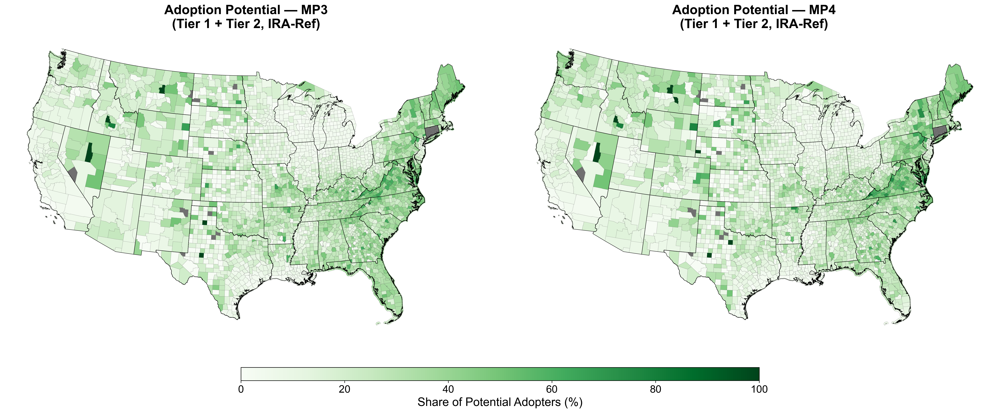

[OK] Adoption choropleth generated


In [37]:
if gdf_counties_raw is not None:
    from matplotlib.colors import Normalize

    # Sequential monochromatic colormap — adoption rate is always 0–100%
    _adopt_cmap = 'Greens'
    _adopt_norm = Normalize(vmin=0, vmax=100)
    # _adopt_cbar_ticks = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]

    print("\n--- Summary: adoption_rate_pct ---")
    for mp in selected_mps:
        _v = adoption_rate_results[mp]['adoption_rate_pct'].dropna()
        _pct_high = (_v >= 50).mean() * 100
        print(f"  MP{mp}: n={len(_v):,} counties | "
              f"min={_v.min():.1f}% | med={_v.median():.1f}% | "
              f"mean={_v.mean():.1f}% | max={_v.max():.1f}% | "
              f"{_pct_high:.1f}% of counties ≥ 50% adoption potential")

    plot_combined_choropleth(
        gdf_counties_raw, adoption_rate_results,
        column='adoption_rate_pct',
        title_template='Adoption Potential — MP{mp}\n(Tier 1 + Tier 2, IRA-Ref)',
        cbar_label='Share of Potential Adopters (%)',
        cmap=_adopt_cmap, norm=_adopt_norm,
        # cbar_ticks=_adopt_cbar_ticks,
        selected_mps=selected_mps,
        geo_level='county',
        save_figure=SAVE_FIGURES,
        output_path=os.path.join(PROJECT_ROOT, 'county_adoption_rate_combined.png'),
    )

    print("[OK] Adoption choropleth generated")
else:
    print("[WARN] Adoption choropleth skipped — county shapefile not available")


## Adoption Potential Dotplot Maps

In [38]:

# =============================================================================
# ADOPTION POTENTIAL PARAMETERS (base-case defaults)
# =============================================================================
# These mirror the upstream TARE pipeline settings. The column name convention
# encodes all parameters: e.g. 'iraRef_mp3_heating_adoption_central_inmap_acs_v4MID_fixed_base'
#
# Only change these if running a sensitivity analysis. For the paper's
# primary results, these are the correct values.

scc = 'central'                          # Social cost of carbon estimate
rcm_model = 'inmap'                      # Reduced-complexity model (InMAP)
cr_function = 'acs'                      # Concentration-response function (ACS)
cost_scenario = 'v4MID'                  # REMDB v4 midpoint cost scenario
discount_rate = 'fixed_base'             # 7% fixed discount rate
hvac_replacement_scenario = 'heating'    # Case A: Heating Only

# Map selected_mps to the naming convention used by the dotplot
HEATING_MEASURE_PACKAGES = selected_mps

HEATING_MP_SUBTITLES = {
    3: 'Single-stage, min-efficiency ASHP (9 HSPF1, ~8.0-8.5 HSPF2)',
    4: 'Variable-speed, high-efficiency ASHP (13-14 HSPF1, ~11.0-11.9 HSPF2)',
}

print(f"Sensitivity parameters set:")
print(f"  SCC: {scc}, RCM: {rcm_model}, CR: {cr_function}")
print(f"  Cost: {cost_scenario}, Discount: {discount_rate}")
print(f"  HVAC scenario: {hvac_replacement_scenario}")
print(f"  Measure packages: {HEATING_MEASURE_PACKAGES}")


Sensitivity parameters set:
  SCC: central, RCM: inmap, CR: acs
  Cost: v4MID, Discount: fixed_base
  HVAC scenario: heating
  Measure packages: [3, 4]


Heat Pump Adoption Potential — Heating Replacement Only
Discount Rate: fixed_base | Cost Scenario: v4MID

Fuel sample counts (national, approx.):
  Electricity: 25.6M homes
  Fuel Oil: 4.2M homes
  Natural Gas: 43.8M homes
  Other Fuel: 2.2M homes
  Propane: 4.2M homes

--- MP3 sample stats ---
  Electricity — LMI: 22.9% of sample, 18.4M homes
  Fuel Oil — LMI: 3.7% of sample, 3.0M homes
  Natural Gas — LMI: 38.8% of sample, 31.1M homes
  Propane — LMI: 3.8% of sample, 3.1M homes
  Electricity — Overall: 31.9% of sample, 25.6M homes
  Fuel Oil — Overall: 5.2% of sample, 4.2M homes
  Natural Gas — Overall: 54.6% of sample, 43.8M homes
  Propane — Overall: 5.3% of sample, 4.2M homes
  National — Overall: 99.7% of sample, 80.0M homes

--- MP4 sample stats ---
  Electricity — LMI: 22.9% of sample, 18.4M homes
  Fuel Oil — LMI: 3.7% of sample, 3.0M homes
  Natural Gas — LMI: 38.8% of sample, 31.1M homes
  Propane — LMI: 3.8% of sample, 3.1M homes
  Electricity — Overall: 31.9% of sample, 25

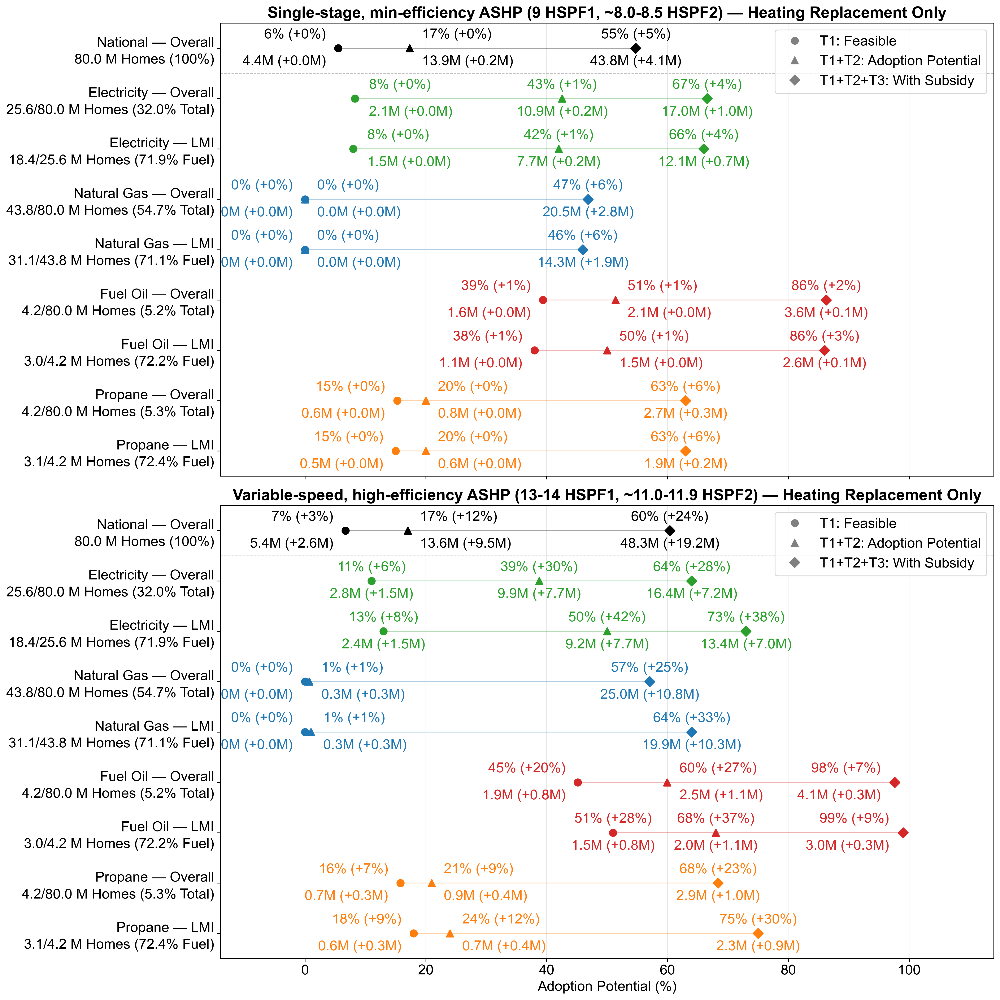

In [40]:
CASE_LABELS = {
    'heating': 'Heating Replacement Only',
    'heating_and_cooling': 'Heating & Cooling Replacement',
}

if not HEATING_MEASURE_PACKAGES:
    print("No active heating measure packages — skipping dotplot.")
else:
    category = 'heating'
    case_label = CASE_LABELS.get(hvac_replacement_scenario, hvac_replacement_scenario)

    # Compute national fuel counts in millions (scaling_factor = 242)
    _src = DATAFRAMES_BY_MP[HEATING_MEASURE_PACKAGES[0]][discount_rate][rcm_model]
    fuel_counts_millions = {
        str(fuel): int(n) * 242 / 1_000_000
        for fuel, n in _src.groupby('base_heating_fuel', observed=True).size().items()
    }

    # --- Print figure header before creating the figure ---
    print(f"Heat Pump Adoption Potential — {case_label}")
    print(f"Discount Rate: {discount_rate} | Cost Scenario: {cost_scenario}")
    print()
    print("Fuel sample counts (national, approx.):")
    for fuel, count in sorted(fuel_counts_millions.items()):
        print(f"  {fuel}: {count:.1f}M homes")
    print()

    n_mps = len(HEATING_MEASURE_PACKAGES)

    # figsize width 16 (was 12) gives labels room at annotation_fontsize=12.
    # Below width=16 at this font size, edge labels (x=0%, x=100%) clip the
    # axis and adjacent labels collide.
    fig, axes = plt.subplots(
        n_mps, 1,
        figsize=(16, 8 * n_mps),
        sharex=True,
        sharey=True,
    )
    if n_mps == 1:
        axes = [axes]

    for row_idx, mp in enumerate(HEATING_MEASURE_PACKAGES):
        ax = axes[row_idx]
        panel_title = f'{HEATING_MP_SUBTITLES.get(mp, f"MP{mp}")} — {case_label}'

        # Build the multi-index adoption DataFrame from TARE output
        source_df = DATAFRAMES_BY_MP[mp][discount_rate][rcm_model]

        mi_df = create_multiIndex_adoption_df(
            df=source_df,
            menu_mp=mp,
            category=category,
            scc=scc,
            rcm_model=rcm_model,
            cr_function=cr_function,
            cost_scenario=cost_scenario,
            discount_rate=discount_rate,
            hvac_replacement_scenario=hvac_replacement_scenario,
        )

        if mi_df is None:
            ax.set_title(panel_title, fontsize=18, fontweight='bold')
            ax.text(0.5, 0.5, 'No data\n(adoption columns missing)',
                    transform=ax.transAxes, ha='center', va='center',
                    fontsize=14, color='gray')
            # Match populated panels' xlim for visual consistency
            ax.set_xlim(-14, 114)
            ax.set_xticks(range(0, 101, 20))
            y_order = list(reversed(GROUPING_ORDER))
            ax.set_ylim(-0.5, len(y_order) - 0.5)
            ax.set_yticks(range(len(y_order)))
            continue

        scenario_names = build_adoption_scenario_names(
            mp, category, scc, rcm_model, cr_function,
            cost_scenario, discount_rate,
            hvac_replacement_scenario=hvac_replacement_scenario,
        )
        preira_col = scenario_names[0]
        iraref_col = scenario_names[1]

        plot_df = prepare_plot_data(
            mi_df, source_df,
            preira_col=preira_col,
            iraref_col=iraref_col,
            income_groups=['LMI'],
        )

        # --- Print sample stats for this panel ---
        print(f"--- MP{mp} sample stats ---")
        sample_info = (
            plot_df[['grouping', 'pct_of_sample', 'weighted_homes_millions']]
            .drop_duplicates('grouping')
            .reset_index(drop=True)
        )
        for _, r in sample_info.iterrows():
            print(f"  {r['grouping']}: {r['pct_of_sample']:.1f}% of sample, "
                  f"{r['weighted_homes_millions']:.1f}M homes")
        print()

        # xlim_margin=14 scales the axis margin to the larger annotation font.
        # Default 12 works for fontsize=7; 14 is needed for fontsize=12.
        plot_adoption_panel(
            plot_df, ax, title=panel_title,
            title_fontsize=18,
            ytick_fontsize=16,
            annotation_fontsize=16,
            xlim_margin=14,
            fuel_counts_millions=fuel_counts_millions,
        )
        ax.tick_params(axis='both', labelsize=16)

        # Per-subplot legend — upper right of each panel
        ax.legend(handles=_build_legend_handles(), loc='upper right', fontsize=16, frameon=True)

        # Only bottom panel gets x-axis label
        if row_idx < n_mps - 1:
            ax.set_xlabel('')

    fig.tight_layout()

    # --- Save ---
    out_dir = os.path.join('.', 'figures')
    os.makedirs(out_dir, exist_ok=True)
    case_tag = 'caseA' if hvac_replacement_scenario == 'heating' else 'caseB'
    for ext in ('png', 'pdf'):
        fig.savefig(
            os.path.join(out_dir, f'figure5_adoption_dotplot_{case_tag}_{location_id}.{ext}'),
            dpi=600, bbox_inches='tight',
        )
    print(f"Saved to {out_dir}/figure5_adoption_dotplot_{case_tag}_{location_id}.{{png,pdf}}")
    plt.show()


In [45]:
mp = selected_mps[0]
df = DATAFRAMES_BY_MP[mp]['fixed_base']['inmap']
col_more = f'preIRA_mp{mp}_heating_and_cooling_private_npv_moreWTP_v4MID_fixed_base'
col_ira  = f'iraRef_mp{mp}_heating_and_cooling_private_npv_moreWTP_v4MID_fixed_base'
print(col_more in df.columns, col_ira in df.columns)
# If False, print a few matching columns:
print([c for c in df.columns if 'private_npv' in c])

True True
['preIRA_mp3_heating_private_npv_lessWTP_v3_fixed_base', 'preIRA_mp3_heating_private_npv_moreWTP_v3_fixed_base', 'preIRA_mp3_heating_private_npv_lessWTP_v4MID_fixed_base', 'preIRA_mp3_heating_private_npv_moreWTP_v4MID_fixed_base', 'preIRA_mp3_heating_and_cooling_private_npv_lessWTP_v4MID_fixed_base', 'preIRA_mp3_heating_and_cooling_private_npv_moreWTP_v4MID_fixed_base', 'iraRef_mp3_heating_private_npv_lessWTP_v3_fixed_base', 'iraRef_mp3_heating_private_npv_moreWTP_v3_fixed_base', 'iraRef_mp3_heating_private_npv_lessWTP_v4MID_fixed_base', 'iraRef_mp3_heating_private_npv_moreWTP_v4MID_fixed_base', 'iraRef_mp3_heating_and_cooling_private_npv_lessWTP_v4MID_fixed_base', 'iraRef_mp3_heating_and_cooling_private_npv_moreWTP_v4MID_fixed_base']


In [ ]:
df = DATAFRAMES_BY_MP[mp]['fixed_base']['inmap']
adoption_col = find_adoption_column(
    df,
    mp=mp,
    cost_scenario='v4MID',
    discount_rate_key='fixed_base',
    rcm_model_key='inmap',
)
print(f"Adoption column found: {adoption_col}")

Adoption column found: iraRef_mp3_heating_adoption_central_inmap_acs_v4MID_fixed_base


In [ ]:
df = DATAFRAMES_BY_MP[mp]['fixed_base']['inmap']
print([c for c in df.columns if 'adoption' in c])

['preIRA_mp3_heating_adoption_lower_inmap_acs_v3_fixed_base', 'preIRA_mp3_heating_adoption_central_inmap_acs_v3_fixed_base', 'preIRA_mp3_heating_adoption_upper_inmap_acs_v3_fixed_base', 'preIRA_mp3_heating_adoption_lower_inmap_acs_v4MID_fixed_base', 'preIRA_mp3_heating_adoption_central_inmap_acs_v4MID_fixed_base', 'preIRA_mp3_heating_adoption_upper_inmap_acs_v4MID_fixed_base', 'preIRA_mp3_heating_and_cooling_adoption_lower_inmap_acs_v4MID_fixed_base', 'preIRA_mp3_heating_and_cooling_adoption_central_inmap_acs_v4MID_fixed_base', 'preIRA_mp3_heating_and_cooling_adoption_upper_inmap_acs_v4MID_fixed_base', 'iraRef_mp3_heating_adoption_lower_inmap_acs_v3_fixed_base', 'iraRef_mp3_heating_adoption_central_inmap_acs_v3_fixed_base', 'iraRef_mp3_heating_adoption_upper_inmap_acs_v3_fixed_base', 'iraRef_mp3_heating_adoption_lower_inmap_acs_v4MID_fixed_base', 'iraRef_mp3_heating_adoption_central_inmap_acs_v4MID_fixed_base', 'iraRef_mp3_heating_adoption_upper_inmap_acs_v4MID_fixed_base', 'iraRef_mp3

In [ ]:
col_more = f'preIRA_mp{mp}_heating_and_cooling_private_npv_moreWTP_v4MID_fixed_base'
col_ira  = f'iraRef_mp{mp}_heating_and_cooling_private_npv_moreWTP_v4MID_fixed_base'

f'preIRA_mp{mp}_heating_and_cooling_private_npv_moreWTP_v4MID_fixed_base'
f'iraRef_mp{mp}_heating_and_cooling_private_npv_moreWTP_v4MID_fixed_base'

f'preIRA_mp{mp}_heating_private_npv_moreWTP_v4MID_fixed_base'
f'iraRef_mp{mp}_heating_private_npv_moreWTP_v4MID_fixed_base'

---
## Task 2.1 — Private NPV Distribution: Break-Even Histogram
---

Histograms of per-building private NPV (more WTP) under two policy scenarios:
- **Pre-IRA:** No rebates. Break-even at $0 — buildings left of zero need subsidy.
- **IRA-Ref:** With IRA rebates applied. Shift right = more buildings break even.

Stacked by baseline heating fuel. Reference lines: U.S. and PA median/mean.
`moreWTP` variant used (conservative willingness-to-pay assumption).


In [ ]:
# =============================================================================
# TASK 2.1 — STEP 1: Verify WTP columns and print summary statistics
# =============================================================================
for mp in selected_mps:
    df_check = DATAFRAMES_BY_MP[mp]['fixed_base']['inmap']
    col_pre = f'preIRA_mp{mp}_heating_private_npv_moreWTP_v4MID_fixed_base'
    col_ira = f'iraRef_mp{mp}_heating_private_npv_moreWTP_v4MID_fixed_base'
    assert col_pre in df_check.columns, f"Not found: {col_pre}"
    assert col_ira in df_check.columns, f"Not found: {col_ira}"

    df_pa = df_check[df_check['state'] == 'PA']
    mp_label = HEATING_MP_SUBTITLES.get(mp, f'MP{mp}')
    print(f"\n--- {mp_label} ---")
    for label, s in [
        ('National pre-IRA', df_check[col_pre]),
        ('National IRA',     df_check[col_ira]),
        ('PA pre-IRA',       df_pa[col_pre]),
        ('PA IRA',           df_pa[col_ira]),
    ]:
        print(f"  {label:25s}: median={s.median():>10,.0f}  mean={s.mean():>10,.0f}")

print("\n[OK] WTP columns verified for all selected MPs")

In [ ]:
# =============================================================================
# TASK 2.1 — STEP 2: Private NPV break-even histogram (n_mps × 2 grid)
# =============================================================================
# Uses create_subplot_grid_histogram from utils — stacked by heating fuel.
# Reference lines (US/PA median & mean) added post-call per subplot.
# Font sizes corrected post-call to match dotplot reference style (18/16 pt).
# =============================================================================

from cmu_tare_model.utils.data_visualization_histograms import create_subplot_grid_histogram

# ── Font size constants (match dotplot reference style) ──────────────────────
_TITLE_FS  = 18
_LABEL_FS  = 16
_TICK_FS   = 16
_LEGEND_FS = 14

# ── Build per-MP column lists ─────────────────────────────────────────────────
_npv_dfs        = []
_npv_cols       = []
_npv_df_indices = []
_npv_titles     = []
_npv_positions  = []

for _i, _mp in enumerate(selected_mps):
    _df_mp   = DATAFRAMES_BY_MP[_mp]['fixed_base']['inmap']
    _col_pre = f'preIRA_mp{_mp}_heating_private_npv_moreWTP_v4MID_fixed_base'
    _col_ira = f'iraRef_mp{_mp}_heating_private_npv_moreWTP_v4MID_fixed_base'
    _label   = HEATING_MP_SUBTITLES.get(_mp, f'MP{_mp}')

    _npv_dfs.append(_df_mp)
    _npv_cols       += [_col_pre, _col_ira]
    _npv_df_indices += [_i, _i]
    _npv_titles     += [
        f'{_label}\nPre-IRA NPV (no rebates)',
        f'{_label}\nNPV with IRA Rebates',
    ]
    _npv_positions  += [(_i, 0), (_i, 1)]

_n_mps = len(selected_mps)

# ── Call utility ──────────────────────────────────────────────────────────────
fig_npv = create_subplot_grid_histogram(
    dataframes=_npv_dfs,
    dataframe_indices=_npv_df_indices,
    subplot_positions=_npv_positions,
    x_cols=_npv_cols,
    x_labels=['Private NPV, more WTP ($)'] * (_n_mps * 2),
    y_labels=['Count'] * (_n_mps * 2),
    subplot_titles=_npv_titles,
    bin_number=50,
    lower_percentile=1,
    upper_percentile=99,
    figure_size=(18, 9 * _n_mps),
    color_code='base_heating_fuel',
    statistic='count',
    # suptitle='Private NPV Distribution by Policy Scenario\n(more WTP, v4MID, fixed_base discount rate)',
)

# ── Add reference lines (US / PA median & mean) per subplot ──────────────────
# Note: utility already draws axvline(0) internally; no need to repeat here.
_ax_list = [ax for ax in fig_npv.get_axes() if ax.get_visible()]

for _ax_idx, (_pos, _mp, _col) in enumerate(
        zip(_npv_positions,
            [_mp for _mp in selected_mps for _ in range(2)],
            _npv_cols)):
    _ax    = _ax_list[_ax_idx]
    _df_mp = DATAFRAMES_BY_MP[_mp]['fixed_base']['inmap']
    _df_pa = _df_mp[_df_mp['state'] == 'PA']

    _nat_med  = _df_mp[_col].median()
    _nat_mean = _df_mp[_col].mean()
    _pa_med   = _df_pa[_col].median()
    _pa_mean  = _df_pa[_col].mean()

    _ax.axvline(_nat_med,  color='tab:blue', ls='-',  lw=2,
                label=f'US median:  ${_nat_med:,.0f}')
    _ax.axvline(_nat_mean, color='tab:blue', ls='--', lw=2,
                label=f'US mean:    ${_nat_mean:,.0f}')
    _ax.axvline(_pa_med,   color='tab:red',  ls='-',  lw=2,
                label=f'PA median:  ${_pa_med:,.0f}')
    _ax.axvline(_pa_mean,  color='tab:red',  ls='--', lw=2,
                label=f'PA mean:    ${_pa_mean:,.0f}')
    _ax.legend(fontsize=_LEGEND_FS, loc='upper right', frameon=True)

# ── Post-call font size correction ───────────────────────────────────────────
for _ax in fig_npv.get_axes():
    if not _ax.get_visible():
        continue
    _ax.title.set_fontsize(_TITLE_FS)
    _ax.xaxis.label.set_fontsize(_LABEL_FS)
    _ax.yaxis.label.set_fontsize(_LABEL_FS)
    _ax.tick_params(axis='both', labelsize=_TICK_FS)
    if _ax.get_legend():
        plt.setp(_ax.get_legend().get_texts(), fontsize=_LEGEND_FS)

if fig_npv._suptitle:
    fig_npv._suptitle.set_fontsize(_TITLE_FS)

fig_npv.tight_layout()

# ── Save ──────────────────────────────────────────────────────────────────────
_out_dir = os.path.join('.', 'figures')
os.makedirs(_out_dir, exist_ok=True)
for _ext in ('png', 'pdf'):
    fig_npv.savefig(
        os.path.join(_out_dir, f'figure_npv_histogram_{location_id}.{_ext}'),
        dpi=600, bbox_inches='tight',
    )
print(f"[OK] NPV histogram saved → figures/figure_npv_histogram_{location_id}.{{png,pdf}}")
plt.show()

---
## Task 2.2 — Subsidy Required: Distribution Under Pre-IRA vs. IRA Policy
---

Histogram of the **subsidy required** to make the heat-pump private NPV ≥ 0,
for homes that remain NPV-negative under each policy scenario.

- **Pre-IRA (col 0):** all homes with NPV < 0 before rebates — subsidy = |NPV_pre|
- **IRA (col 1):** homes still NPV-negative after IRA rebates — remaining subsidy = |NPV_ira|

Stacked by baseline heating fuel. Median dashed line per panel.
`moreWTP`, `v4MID`, `fixed_base` discount rate.

**Verification:** Each MP row — IRA panel has **fewer homes** and **smaller median** than pre-IRA.